# 實例分割(Instance Segmentation)
### 原始程式碼：[Mask R-CNN Instance Segmentation with PyTorch](https://learnopencv.com/mask-r-cnn-instance-segmentation-with-pytorch/)
### 論文: [Mask R-CNN](https://arxiv.org/pdf/1703.06870.pdf)

## 載入套件

In [1]:
import random

import cv2
import matplotlib.pyplot as plt
import numpy as np
from torchvision import models, transforms

from PIL import Image

 ## COCO 資料集辨識物件名稱

In [2]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__',
    'person',
    'bicycle',
    'car',
    'motorcycle',
    'airplane',
    'bus',
    'train',
    'truck',
    'boat',
    'traffic light',
    'fire hydrant',
    'N/A',
    'stop sign',
    'parking meter',
    'bench',
    'bird',
    'cat',
    'dog',
    'horse',
    'sheep',
    'cow',
    'elephant',
    'bear',
    'zebra',
    'giraffe',
    'N/A',
    'backpack',
    'umbrella',
    'N/A',
    'N/A',
    'handbag',
    'tie',
    'suitcase',
    'frisbee',
    'skis',
    'snowboard',
    'sports ball',
    'kite',
    'baseball bat',
    'baseball glove',
    'skateboard',
    'surfboard',
    'tennis racket',
    'bottle',
    'N/A',
    'wine glass',
    'cup',
    'fork',
    'knife',
    'spoon',
    'bowl',
    'banana',
    'apple',
    'sandwich',
    'orange',
    'broccoli',
    'carrot',
    'hot dog',
    'pizza',
    'donut',
    'cake',
    'chair',
    'couch',
    'potted plant',
    'bed',
    'N/A',
    'dining table',
    'N/A',
    'N/A',
    'toilet',
    'N/A',
    'tv',
    'laptop',
    'mouse',
    'remote',
    'keyboard',
    'cell phone',
    'microwave',
    'oven',
    'toaster',
    'sink',
    'refrigerator',
    'N/A',
    'book',
    'clock',
    'vase',
    'scissors',
    'teddy bear',
    'hair drier',
    'toothbrush',
]

## 下載 Mask RCNN 預先訓練模型

In [3]:
# Mask RCNN 預先訓練模型
model = models.detection.maskrcnn_resnet50_fpn(weights=models.detection.MaskRCNN_ResNet50_FPN_Weights.DEFAULT)
model

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

## 定義物件偵測相關函數

In [4]:
# 設定遮罩的顏色
def random_colour_masks(image: np.ndarray) -> np.ndarray:
    colours = [
        [0, 255, 0],
        [0, 0, 255],
        [255, 0, 0],
        [0, 255, 255],
        [255, 255, 0],
        [255, 0, 255],
        [80, 70, 180],
        [250, 80, 190],
        [245, 145, 50],
        [70, 150, 250],
        [50, 190, 190],
    ]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    r[image == 1], g[image == 1], b[image == 1] = colours[random.randrange(0, 10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

In [5]:
# 物件偵測，傳回遮罩、邊框、類別
def get_prediction(img_path: str, threshold: float) -> tuple[np.ndarray, list[list[tuple[int, int]]], list[str]]:
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
    masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(int(i[0]), int(i[1])), (int(i[2]), int(i[3]))] for i in list(pred[0]['boxes'].detach().numpy())]
    masks = masks[: pred_t + 1]
    pred_boxes = pred_boxes[: pred_t + 1]
    pred_class = pred_class[: pred_t + 1]
    return masks, pred_boxes, pred_class

In [6]:
# 物件偵測含遮罩上色、顯示結果
def instance_segmentation_api(
    img_path: str, threshold: float = 0.5, rect_th: int = 3, text_size: int = 2, text_th: int = 2
) -> None:
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
        rgb_mask = random_colour_masks(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        print(boxes[i][0], boxes[i][1])
        cv2.rectangle(img, boxes[i][0], boxes[i][1], color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img, pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 0), thickness=text_th)
    plt.figure(figsize=(20, 30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

## 流程測試

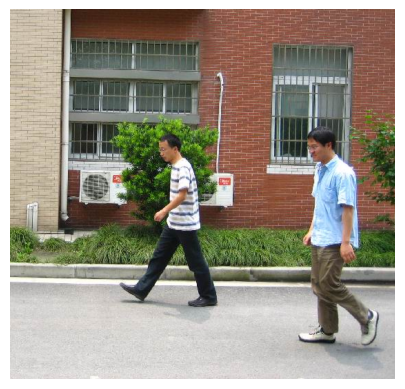

In [7]:
# 顯示測試圖檔
img = Image.open('Mask_RCNN/PennFudanPed/PNGImages/FudanPed00001.png')
plt.imshow(img)
plt.axis('off')
plt.show()

## 模型預測

In [8]:
# 模型預測
transform = transforms.Compose([transforms.ToTensor()])
img_tensor = transform(img)

model.eval()
pred = model([img_tensor])

# 顯示模型第一筆預測內容
pred[0]

{'boxes': tensor([[158.8724, 174.3871, 300.8517, 433.8237],
         [418.3602, 166.1681, 536.1719, 490.1026],
         [243.5272, 223.3718, 269.0291, 251.2439]], grad_fn=<StackBackward0>),
 'labels': tensor([ 1,  1, 27]),
 'scores': tensor([0.9998, 0.9996, 0.1157], grad_fn=<IndexBackward0>),
 'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]],
 
 
         [[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]],
 
 
         [[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
        

## 顯示遮罩

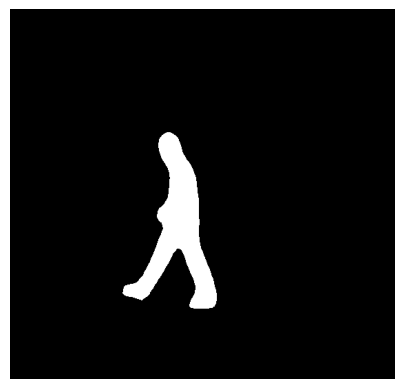

In [9]:
# 保留遮罩值>0.5的像素，其他一律為 0
masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()

# 顯示遮罩
plt.imshow(masks[0], cmap='gray')
plt.axis('off')
plt.show()

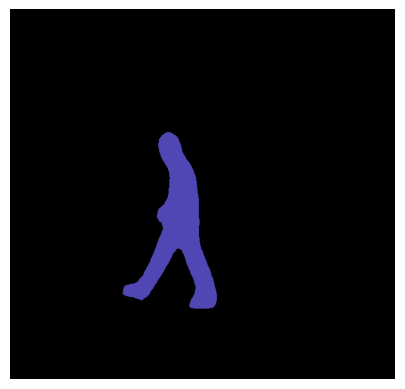

In [10]:
# 遮罩上色
mask1 = random_colour_masks(masks[0])
plt.imshow(mask1)
plt.axis('off')
plt.show()

## 原圖加遮罩

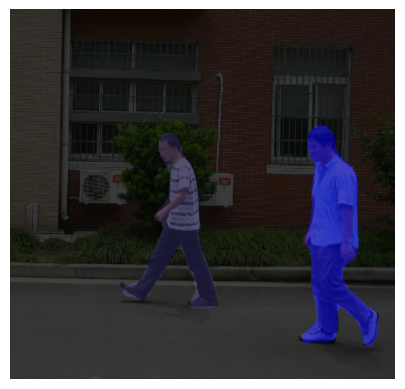

In [11]:
# 原圖加遮罩
blend_img = cv2.addWeighted(np.asarray(img), 0.5, mask1, 0.5, 0)
# 第 2 個遮罩
mask2 = random_colour_masks(masks[1])
blend_img = cv2.addWeighted(np.asarray(blend_img), 0.5, mask2, 0.5, 0)

plt.imshow(blend_img)
plt.axis('off')
plt.show()

## API 測試

(2, 196) (296, 788)
(528, 214) (822, 800)
(793, 263) (1084, 796)
(1040, 273) (1377, 792)
(240, 219) (514, 794)
(430, 190) (637, 777)
(800, 91) (998, 442)
(1103, 105) (1211, 393)
(994, 199) (1149, 519)
(1175, 168) (1377, 589)
(612, 104) (855, 479)
(375, 131) (492, 361)
(174, 45) (332, 415)
(792, 111) (1053, 616)
(1260, 229) (1376, 594)


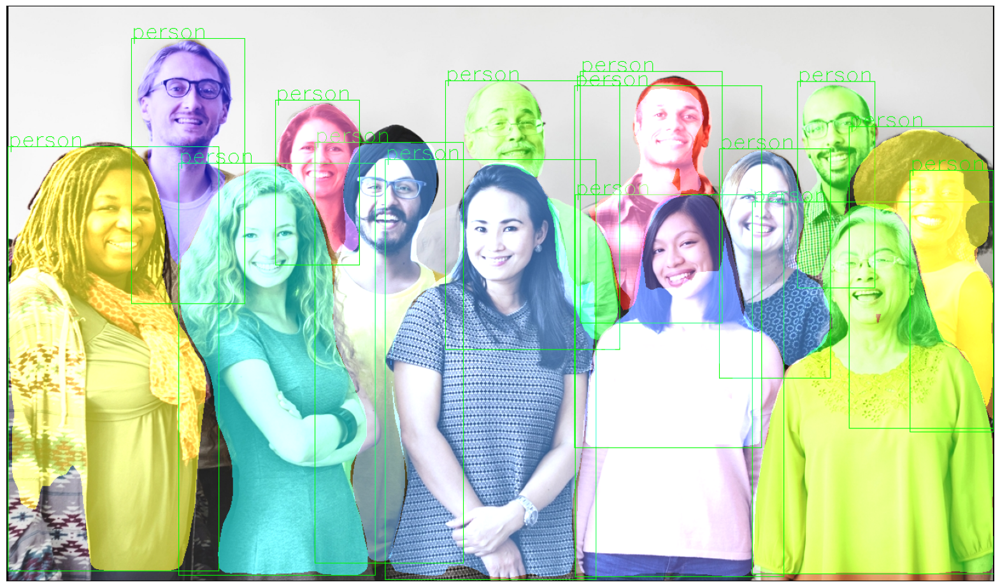

In [12]:
instance_segmentation_api('Mask_RCNN/people1.jpg', 0.5, rect_th=1, text_size=1, text_th=1)

(695, 313) (800, 364)
(825, 351) (1033, 449)
(942, 435) (1340, 625)
(150, 350) (410, 437)
(409, 311) (568, 360)
(207, 456) (539, 657)
(926, 307) (1088, 358)
(469, 356) (690, 449)
(588, 445) (878, 711)
(1053, 351) (1328, 438)


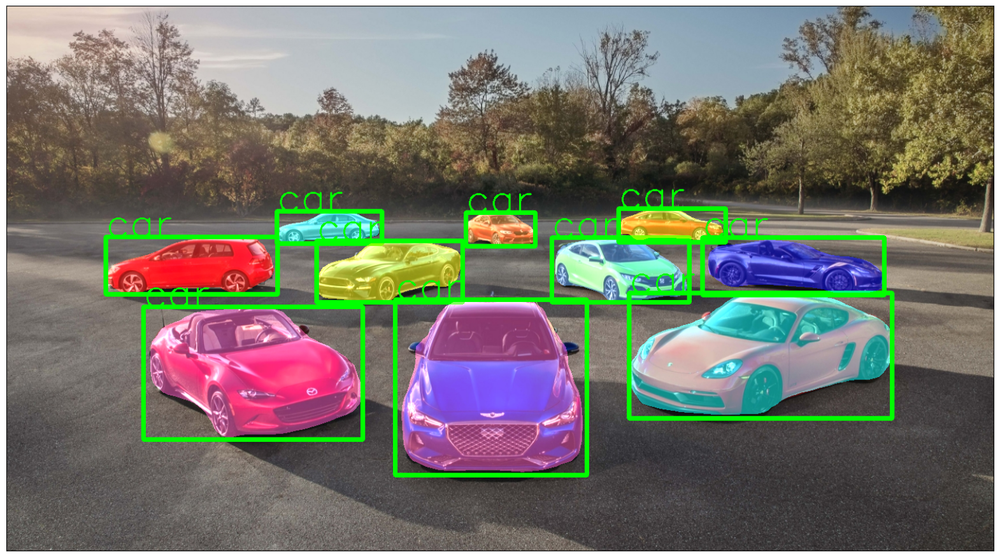

In [13]:
instance_segmentation_api('Mask_RCNN/car.jpg', 0.9, rect_th=5, text_size=2, text_th=2)

(192, 354) (278, 423)
(11, 455) (162, 565)
(317, 340) (395, 405)
(623, 297) (677, 344)
(666, 432) (765, 507)
(638, 384) (730, 464)
(411, 250) (459, 288)
(141, 497) (286, 635)
(694, 561) (821, 637)
(638, 343) (707, 396)
(736, 199) (776, 210)
(452, 217) (482, 243)
(228, 537) (255, 563)
(681, 500) (791, 595)
(367, 236) (399, 266)
(495, 397) (602, 531)
(810, 204) (852, 218)
(528, 260) (577, 306)
(508, 355) (570, 399)
(513, 289) (574, 348)
(468, 200) (488, 220)
(484, 193) (502, 211)
(196, 186) (207, 216)
(528, 236) (566, 262)
(598, 199) (668, 283)
(605, 249) (663, 315)
(516, 333) (574, 371)
(568, 183) (583, 200)
(537, 188) (563, 213)
(537, 217) (565, 237)
(499, 511) (611, 577)
(404, 201) (454, 239)
(532, 253) (570, 269)
(531, 233) (564, 247)
(683, 532) (802, 622)
(481, 530) (625, 636)
(528, 266) (575, 289)


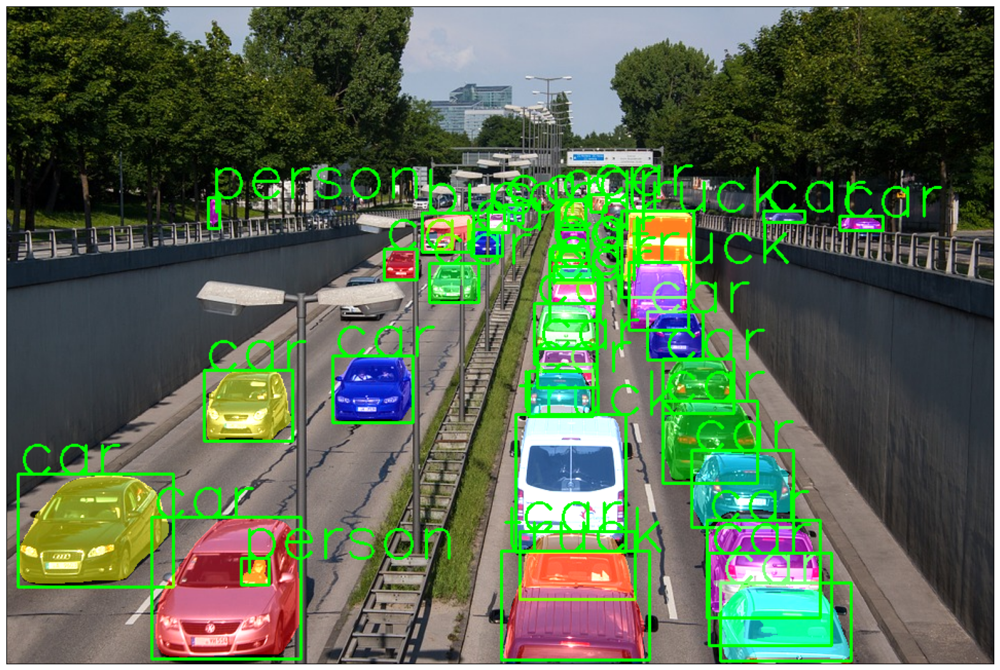

In [14]:
instance_segmentation_api('Mask_RCNN/traffic.jpg', 0.6, rect_th=2, text_size=2, text_th=2)

(428, 130) (584, 403)
(180, 127) (324, 407)
(290, 169) (449, 410)


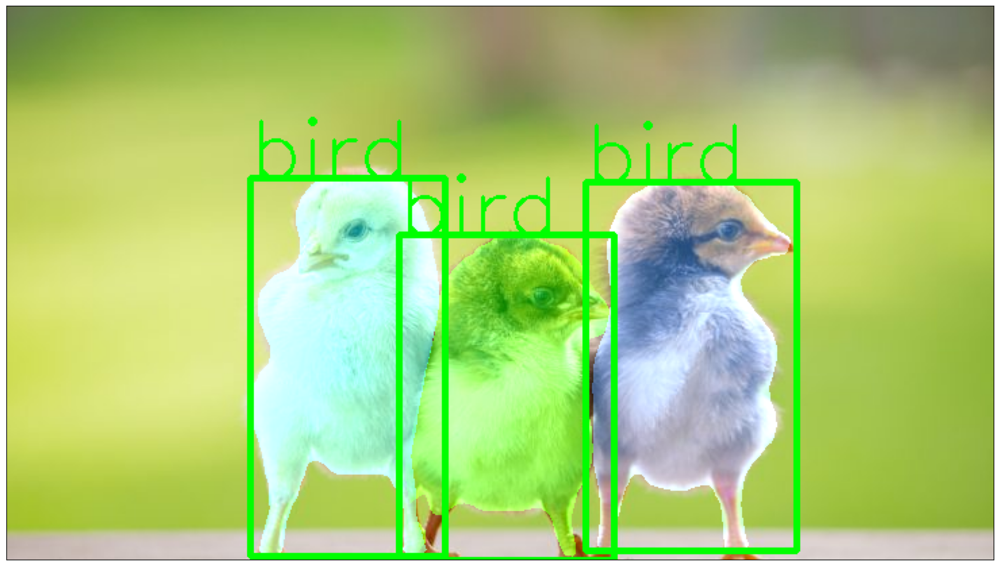

In [15]:
instance_segmentation_api('Mask_RCNN/birds.jpg', 0.9)  

(287, 195) (351, 319)
(398, 208) (452, 319)
(1, 88) (246, 314)
(374, 212) (398, 270)
(344, 209) (362, 269)
(203, 209) (265, 316)
(466, 215) (493, 270)
(362, 212) (381, 266)
(189, 202) (201, 234)
(371, 168) (389, 188)
(464, 212) (473, 242)
(443, 212) (457, 248)
(197, 209) (222, 240)
(228, 211) (262, 278)
(396, 242) (426, 284)
(486, 213) (500, 271)


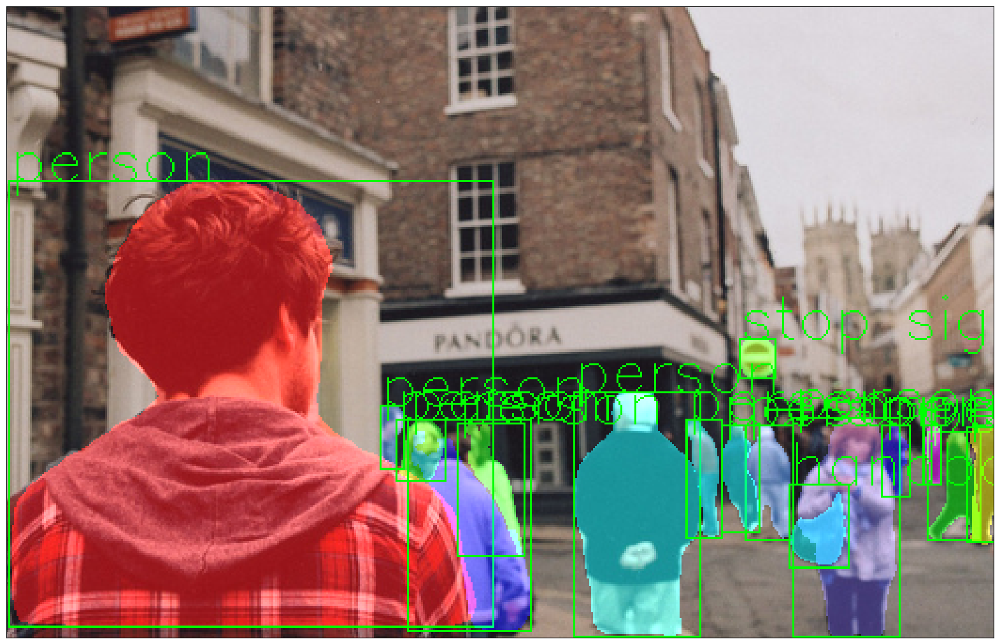

In [16]:
instance_segmentation_api('Mask_RCNN/people2.jpg', 0.8, rect_th=1, text_size=1, text_th=1)

(1713, 593) (3499, 4020)
(644, 1692) (1983, 3994)


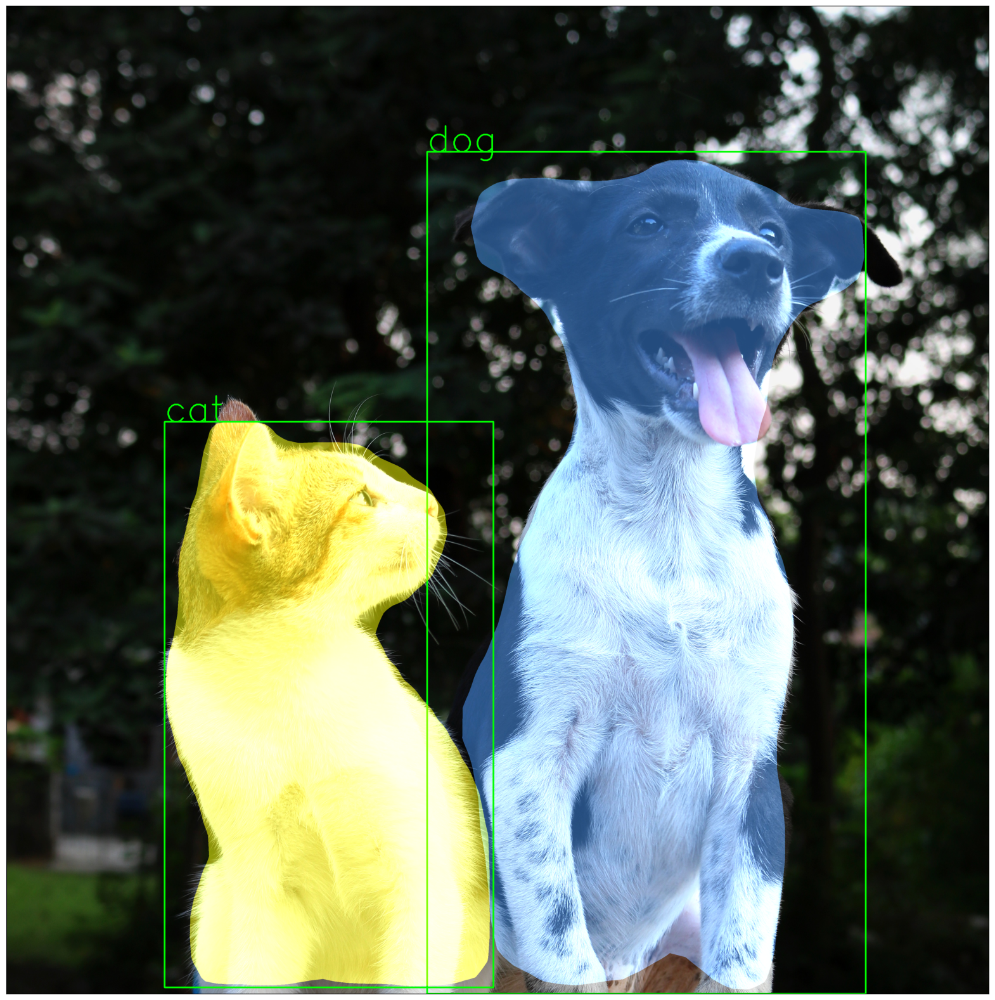

In [17]:
instance_segmentation_api('Mask_RCNN/cat_dog.jpg', 0.95, rect_th=5, text_size=5, text_th=5)

## 應用：背景模糊化

In [18]:
# 偵測所有物件，傳回遮罩
def pick_person_mask(
    img_path: str, threshold: float = 0.5, rect_th: int = 3, text_size: int = 3, text_th: int = 3
) -> np.ndarray:
    # get the predicted masks and boxes and their corresponding labels
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    # pick the indices belonging to person
    person_ids = [i for i in range(len(pred_cls)) if pred_cls[i] == "person"]
    # pick the masks with the person-ids
    person_masks = masks[person_ids, :, :]
    # create a single mask out of all the instances and clip them
    persons_mask = person_masks.sum(axis=0)
    persons_mask = np.clip(persons_mask, 0, 1)
    return persons_mask

## 背景模糊化

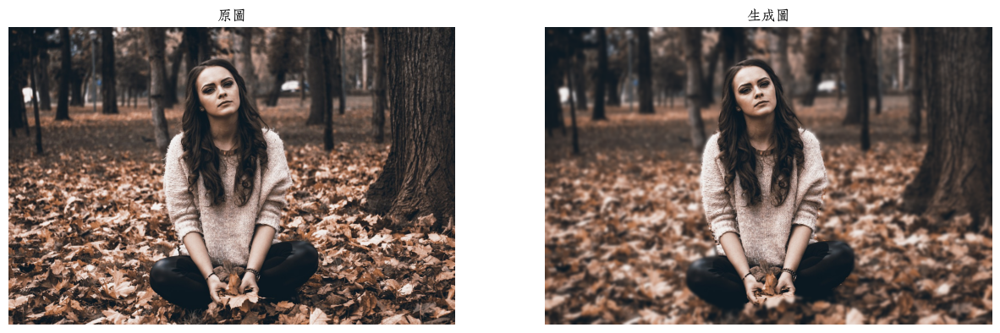

In [19]:
# 讀取檔案
img_path = "Mask_RCNN/blur.jpg"
img = cv2.imread(img_path)

# 取得人物遮罩
person_mask = pick_person_mask(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3).astype(np.uint8)
# 把遮罩 RGB 設為相同值
person_mask = np.repeat(person_mask[:, :, None], 3, axis=2)

# 照片模糊化
img_blur = cv2.GaussianBlur(img, (21, 21), 0)

# 人物部分採用原圖，其他部分使用模糊化的圖
final_img = np.where(person_mask == 1, img, img_blur)

# fix 中文亂碼
plt.rcParams['font.sans-serif'] = ['Zhuque Fangsong (technical preview)']
plt.rcParams['axes.unicode_minus'] = False

# 顯示原圖與生成圖，比較背景的處理效果
plt.figure(figsize=(15, 15))
plt.subplot(121)
plt.title('原圖')
plt.imshow(img[:, :, ::-1])
plt.axis('off')
plt.subplot(122)
plt.title('生成圖')
plt.imshow(final_img[:, :, ::-1])
plt.axis('off')
plt.show()